In [1]:
from matplotlib import cm
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# from cartopy.mpl.geoaxes import GeoAxes
import numpy as np
from obspy.signal.tf_misfit import plot_tfr
from lasif.exceptions import LASIFError
import cmasher as cmr
from typing import Union, List, Dict 
import cartopy.crs as ccrs
from glob import glob
import pandas as pd
import cartopy as cp
import toml
from tqdm import tqdm
import os

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
savepath = "reveal_good.jpg"
dpi = 300

In [3]:
GOOD_EVENTS = [
   "GCMT_event_ALASKA_PENINSULA_Mag_6.8_2015-5-29-7",
    'GCMT_event_EAST_OF_SOUTH_SANDWICH_ISLANDS_Mag_6.4_2014-3-11-2',
    'GCMT_event_BANDA_SEA_Mag_6.7_2017-10-24-10',
    'GCMT_event_BONIN_ISLANDS_JAPAN_REGION_Mag_6.6_2020-4-18-8',
    'GCMT_event_CARLSBERG_RIDGE_Mag_6.3_2019-4-29-14',
    'GCMT_event_CHILE-ARGENTINA_BORDER_REGION_Mag_6.3_2017-4-15-8',
    'GCMT_event_HINDU_KUSH_REGION_AFGHANISTAN_Mag_6.2_2019-12-20-11',
    'GCMT_event_MARIANA_ISLANDS_Mag_6.4_2019-6-28-15',
    'GCMT_event_NEAR_COAST_OF_NICARAGUA_Mag_6.6_2014-4-11-20',
    'GCMT_event_NEAR_EAST_COAST_OF_HONSHU_JAPAN_Mag_6.4_2020-4-19-20',
    'GCMT_event_NORTH_OF_ASCENSION_ISLAND_Mag_6.3_2019-10-23-16',
    'GCMT_event_NORTHERN_ALASKA_Mag_6.4_2018-8-12-14',
    'GCMT_event_OFF_COAST_OF_NORTHERN_CALIFORNIA_Mag_6.6_2016-12-8-14',
    'GCMT_event_PACIFIC-ANTARCTIC_RIDGE_Mag_6.6_2015-5-19-15',
    'GCMT_event_PERU-BRAZIL_BORDER_REGION_Mag_6.4_2016-12-18-13',
    'GCMT_event_SANTA_CRUZ_ISLANDS_Mag_6.6_2020-5-12-22',
    'GCMT_event_SEA_OF_JAPAN_Mag_6.8_2007-7-16-14',
    'GCMT_event_SOLOMON_ISLANDS_Mag_6.3_2020-1-27-5',
    'GCMT_event_SOUTH_OF_PANAMA_Mag_6.5_2015-1-7-5',
    'GCMT_event_TAIWAN_Mag_6.4_2018-2-6-15',
    'GCMT_event_TONGA_ISLANDS_Mag_6.4_2018-12-23-23',
    'GCMT_event_JAN_MAYEN_ISLAND_REGION_Mag_6.8_2018-11-9-1',
]

In [4]:
datalist = glob('./coordinate_info_REVEAL/*.toml')
#GSNlist = glob('./coordinate_info_REVEAL/*.toml')
good_datalist = []
for ev in GOOD_EVENTS:
  good_datalist.append('./coordinate_info_REVEAL/' + ev + '.toml')

station_events = []
GSN_stations = []
station_good_events = []

for event in tqdm(good_datalist):
  d = toml.load(event)
  for j, rec in enumerate(d['receiver_coords']):
        station_good_events.append(({'longitude':d['src_lon'], 
                                 'latitude':d['src_lat']},
                               {'longitude':d['receiver_coords'][rec]['longitude'], 
                                'latitude':d['receiver_coords'][rec]['latitude']}))


for event in tqdm(datalist):
    d = toml.load(event)
    for j, rec in enumerate(d['receiver_coords']):
        station_events.append(({'longitude':d['src_lon'], 
                                 'latitude':d['src_lat']},
                               {'longitude':d['receiver_coords'][rec]['longitude'], 
                                'latitude':d['receiver_coords'][rec]['latitude']}))
d = toml.load(datalist[0])
for j, rec in enumerate(d["receiver_coords"]):
    #print(rec[:1])
    if "G." == rec[:2]:
      print(rec)
      GSN_stations.append(({'longitude':d['src_lon'], 
                                 'latitude':d['src_lat']},
                               {'longitude':d['receiver_coords'][rec]['longitude'], 
                                'latitude':d['receiver_coords'][rec]['latitude']}))

100%|███████████████████████████████████████████| 50/50 [00:07<00:00,  6.42it/s]


G.AIS
G.ATD
G.CAN
G.CCD
G.CLF
G.COYC
G.CRZF
G.DRV
G.DZM
G.ECH
G.FDF
G.FOMA
G.FUTU
G.HDC
G.IVI
G.KIP
G.MBO
G.MPG
G.NOUC
G.PAF
G.PEL
G.PPTF
G.RER
G.ROCAM
G.SPB
G.SSB
G.TAM
G.TAOE
G.TRIS
G.UNM
G.WUS


In [6]:
np.size(GSN_stations)

62

In [5]:
all_recs_lon = []
all_recs_lat = []
training_src_lon = []
training_src_lat = []
all_recs_lon_GSN = []
all_recs_lat_GSN = []
training_src_lon_GSN = []
training_src_lat_GSN = []
all_good_recs_lon = []
all_good_recs_lat = []
training_good_src_lon = []
training_good_src_lat = []
    
for entry in tqdm(station_events): 
    src, rec = entry
    all_recs_lon.append(rec['longitude'])
    all_recs_lat.append(rec['latitude'])
    training_src_lat.append(src['latitude'])
    training_src_lon.append(src['longitude'])

for entry in tqdm(GSN_stations): 
    src, rec = entry
    all_recs_lon_GSN.append(rec['longitude'])
    all_recs_lat_GSN.append(rec['latitude'])
    training_src_lat_GSN.append(src['latitude'])
    training_src_lon_GSN.append(src['longitude'])

for entry in tqdm(station_good_events): 
    src, rec = entry
    all_good_recs_lon.append(rec['longitude'])
    all_good_recs_lat.append(rec['latitude'])
    training_good_src_lat.append(src['latitude'])
    training_good_src_lon.append(src['longitude'])

# Make sure that each dot is only plotted once
training_src = np.unique(np.array([training_src_lat, training_src_lon]).T, axis=0)
training_src_GSN = np.unique(np.array([training_src_lat_GSN, training_src_lon_GSN]).T, axis=0)
training_good_src = np.unique(np.array([training_good_src_lat, training_good_src_lon]).T, axis=0)
recs = np.unique(np.array([all_recs_lat, all_recs_lon]).T, axis=0)
recs_GSN = np.unique(np.array([all_recs_lat_GSN, all_recs_lon_GSN]).T, axis=0)
recs_good = np.unique(np.array([all_good_recs_lat, all_good_recs_lon]).T, axis=0)


100%|████████████████████████████████| 84589/84589 [00:00<00:00, 1946390.65it/s]


In [6]:
countries = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_0_countries',
    scale='50m',
    facecolor='none'
)
states = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none'
)

In [7]:
from matplotlib.collections import PathCollection
from matplotlib.legend_handler import HandlerPathCollection, HandlerLine2D

def update(handle, orig):
    handle.update_from(orig)
    handle.set_alpha(1)
    

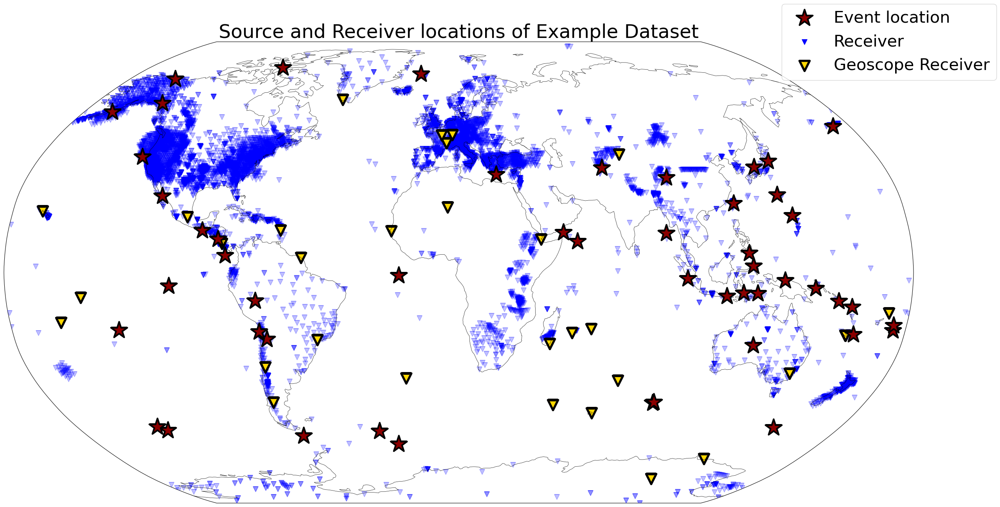

In [8]:
fig = plt.figure(figsize=(30, 18))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson(central_longitude=10))
ax.scatter(training_src[:,1], training_src[:,0], 1000, c = 'darkred', marker = "*", edgecolor = "black", linewidth = 3, transform=ccrs.PlateCarree(), zorder = 14, label = "Event location")
#ax.scatter(training_good_src[:,1], training_good_src[:,0], 1000, c = 'darkred', marker = "*", edgecolor = "black", linewidth = 3, transform=ccrs.PlateCarree(), zorder = 14, label = "Event location")
#ax.scatter(recs[:,1], recs[:,0], 90, c = 'b', marker = "v",alpha = 0.25, transform=ccrs.PlateCarree(), zorder = 12, label = "Receiver")
ax.scatter(recs_good[:,1], recs_good[:,0], 90, c = 'b', marker = "v",alpha = 0.25, transform=ccrs.PlateCarree(), zorder = 12, label = "Receiver")
ax.scatter(recs_GSN[:,1], recs_GSN[:,0], 350, c = 'gold', marker = "v", edgecolor = 'black', linewidth = 4,transform=ccrs.PlateCarree(), zorder = 12, label = "Geoscope Receiver")
ax.add_feature(cp.feature.COASTLINE, lw=0.5, zorder = 13)
ax.legend(loc = "upper right", fontsize = 30, bbox_to_anchor = (1.1, 1.1), handler_map={PathCollection : HandlerPathCollection(update_func= update),
                        plt.Line2D : HandlerLine2D(update_func = update)})
ax.set_title("Source and Receiver locations of Example Dataset", fontsize = 35)
# ax.add_feature(states, edgecolor='black', linewidth=0.25, linestyle='dashed')
# ax.add_feature(countries, edgecolor='black', linewidth=0.25, linestyle ='dotted')
ax.set_global()

plt.savefig(savepath,  bbox_inches='tight', dpi=dpi)
plt.show()

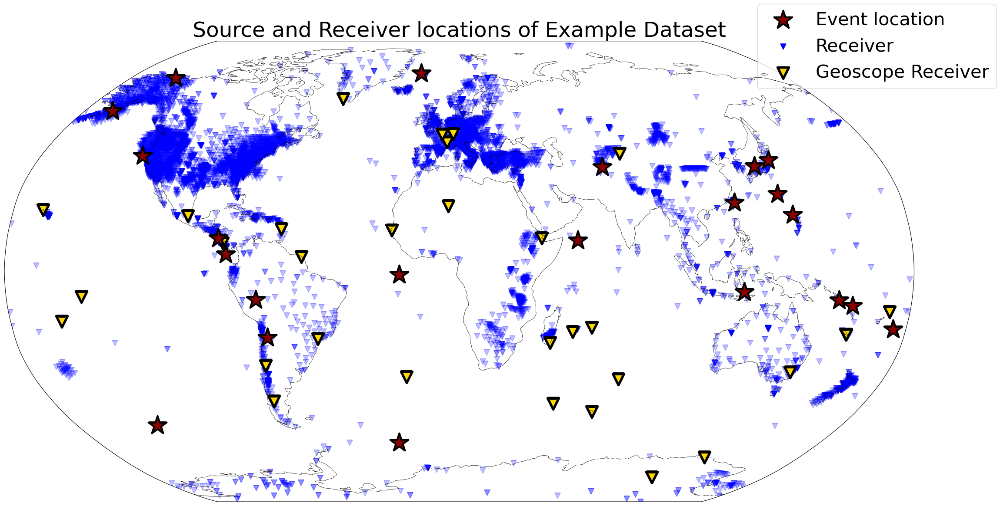

In [9]:
fig = plt.figure(figsize=(27, 16))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson(central_longitude=10))
#ax.scatter(training_src[:,1], training_src[:,0], 1000, c = 'darkred', marker = "*", edgecolor = "black", linewidth = 3, transform=ccrs.PlateCarree(), zorder = 14, label = "Event location all receivers")
ax.scatter(training_good_src[:,1], training_good_src[:,0], 1000, c = 'darkred', marker = "*", edgecolor = "black", linewidth = 3, transform=ccrs.PlateCarree(), zorder = 14, label = "Event location")
ax.scatter(recs_good[:,1], recs_good[:,0], 90, c = 'b', marker = "v",alpha = 0.25, transform=ccrs.PlateCarree(), zorder = 12, label = "Receiver")
ax.scatter(recs_GSN[:,1], recs_GSN[:,0], 350, c = 'gold', marker = "v", edgecolor = 'black', linewidth = 4,transform=ccrs.PlateCarree(), zorder = 12, label = "Geoscope Receiver")
ax.add_feature(cp.feature.COASTLINE, lw=0.5, zorder = 13)
ax.legend(loc = "upper right", fontsize = 30, bbox_to_anchor = (1.1, 1.1), handler_map={PathCollection : HandlerPathCollection(update_func= update),
                        plt.Line2D : HandlerLine2D(update_func = update)})
ax.set_title("Source and Receiver locations of Example Dataset", fontsize = 35)
# ax.add_feature(states, edgecolor='black', linewidth=0.25, linestyle='dashed')
# ax.add_feature(countries, edgecolor='black', linewidth=0.25, linestyle ='dotted')
ax.set_global()

plt.savefig(savepath,  bbox_inches='tight', dpi=dpi)
plt.show()

In [2]:
from itertools import chain
from matplotlib import cm
import matplotlib.pyplot as plt
import toml
from tqdm import tqdm
import numpy as np
import cmasher as cmr
from typing import Union, List, Dict 
import cartopy.crs as ccrs
from glob import glob
import pandas as pd
import cartopy as cp

def project_points(
    projection,
    lon: Union[np.ndarray, float],
    lat: Union[np.ndarray, float],
):
    """
    Define the correct projection function depending on name of projection
    :param projection: Projection to be used
    :type projection: cp.crs.Projection
    :param lon: Longitude coordinate
    :type lon: Union[np.ndarray, float]
    :param lat: Latitude coordinate
    :type lat: Union[np.ndarray, float]
    :return: projected lon, lat points
    :rtype: np.ndarray, np.ndarray
    """
    import pyproj
    import cartopy as cp

    proj_dict = projection.proj4_params

    # projection = pyproj.crs.CRS.from_dict(proj_dict)
    event_loc = pyproj.Proj(proj_dict, preserve_units=True)
    x, y = event_loc(lon, lat)
    if isinstance(x, list):
        x = np.array(x)
        y = np.array(y)
    return x, y
def plot_raydensity(
    map_object,
    station_events: list,
    projection,
):
    """
    Create a ray-density plot for all events and all stations.
    This function is potentially expensive and will use all CPUs available.
    Does require geographiclib to be installed.
    :param map_object: The cartopy domain plot object
    :type map_object: cp.mpl.geoaxes.GeoAxes
    :param station_events: A list of tuples with two dictionaries
    :type station_events: List[Tuple[dict, dict]]
    :param projection: cartopy projection object
    :type projection: cp.crs.Projection
    """
    import ctypes as C
    from lasif.tools.great_circle_binner import GreatCircleBinner
    from lasif.utils import Point
    import multiprocessing
    import progressbar
    from scipy.stats import scoreatpercentile
    import cartopy as cp

    # Merge everything so that a list with coordinate pairs is created. This
    # list is then distributed among all processors.
    station_event_list = []
    for event, station in station_events:
      #  print(event)
      #  print(station)
        e_point = Point(event["latitude"], event["longitude"])
        #for station in stations.values():
        p = Point(station["latitude"], station["longitude"])
        station_event_list.append((e_point, p))

    circle_count = len(station_event_list)

    # The granularity of the latitude/longitude discretization for the
    # raypaths. Attempt to get a somewhat meaningful result in any case.
    if circle_count < 1000:
        lat_lng_count = 1000
    elif circle_count < 10000:
        lat_lng_count = 2000
    else:
        lat_lng_count = 3000

    cpu_count = multiprocessing.cpu_count()

    def to_numpy(raw_array, dtype, shape):
        data = np.frombuffer(raw_array.get_obj())
        data.dtype = dtype
        return data.reshape(shape)

    print(
        "\nLaunching %i great circle calculations on %i CPUs..."
        % (circle_count, cpu_count)
    )

    widgets = [
        "Progress: ",
        progressbar.Percentage(),
        progressbar.Bar(),
        "",
        progressbar.ETA(),
    ]
    pbar = progressbar.ProgressBar(
        widgets=widgets, maxval=circle_count
    ).start()

    def great_circle_binning(
        sta_evs, bin_data_buffer, bin_data_shape, lock, counter
    ):
        new_bins = GreatCircleBinner(
            -89.,
            89.,
            lat_lng_count,
            -180.,
            180.,
            lat_lng_count,
        )
        for event, station in sta_evs:
            with lock:
                counter.value += 1
            if not counter.value % 25:
                pbar.update(counter.value)
            new_bins.add_greatcircle(event, station)

        bin_data = to_numpy(bin_data_buffer, np.uint32, bin_data_shape)
        with bin_data_buffer.get_lock():
            bin_data += new_bins.bins

    # Split the data in cpu_count parts.
    def chunk(seq, num):
        avg = len(seq) / float(num)
        out = []
        last = 0.0
        while last < len(seq):
            out.append(seq[int(last) : int(last + avg)])
            last += avg
        return out

    chunks = chunk(station_event_list, cpu_count)

    # One instance that collects everything.
    collected_bins = GreatCircleBinner(
        -89.,
        89.,
        lat_lng_count,
        -180.,
        180.,
        lat_lng_count,
    )

    # Use a multiprocessing shared memory array and map it to a numpy view.
    collected_bins_data = multiprocessing.Array(
        C.c_uint32, collected_bins.bins.size
    )
    collected_bins.bins = to_numpy(
        collected_bins_data, np.uint32, collected_bins.bins.shape
    )

    # Create, launch and join one process per CPU. Use a shared value as a
    # counter and a lock to avoid race conditions.
    processes = []
    lock = multiprocessing.Lock()
    counter = multiprocessing.Value("i", 0)
    for _i in range(cpu_count):
        processes.append(
            multiprocessing.Process(
                target=great_circle_binning,
                args=(
                    chunks[_i],
                    collected_bins_data,
                    collected_bins.bins.shape,
                    lock,
                    counter,
                ),
            )
        )
    for process in processes:
        process.start()
    for process in processes:
        process.join()

    pbar.finish()

    stations = chain.from_iterable(
        (_i[1].values() for _i in station_events if _i[1])
    )
    # Remove duplicates
    #stations = [(_i["latitude"], _i["longitude"]) for _i in stations]
    #stations = set(stations)
    #title = "%i Events, %i unique raypaths, " "%i unique stations" % (
    #    len(station_events),
    #    circle_count,
    #    len(stations),
    #)
    #plt.title(title, size="xx-large")

    data = collected_bins.bins.transpose()

    if data.max() >= 10:
        data = np.log10(np.clip(data, a_min=0.5, a_max=data.max()))
        data[data >= 0.0] += 0.1
        data[data < 0.0] = 0.0
        max_val = scoreatpercentile(data.ravel(), 99.99)
    else:
        max_val = data.max()

    cmap = cm.get_cmap("gist_heat")
#     cmap = cm.get_cmap("gist_gray_r")
    cmap._init()
    cmap._lut[:120, -1] = np.linspace(0, 1.0, 120) ** 2

    lngs, lats = collected_bins.coordinates
    ln, la = project_points(projection, lngs, lats)

    map_object.pcolormesh(
        ln, la, data, cmap=cmap, vmin=0, vmax=max_val, zorder=10,# alpha = 1.0
    )
    # Draw the coastlines so they appear over the rays. Otherwise things are
    # sometimes hard to see.
#     map_object.add_feature(cp.feature.COASTLINE, zorder=13)
#     map_object.add_feature(cp.feature.BORDERS, linestyle=":", zorder=13)
    
    return map_object


In [16]:
# Create list with information for rayplot
datalist = glob('./coordinate_info_REVEAL/*.toml')
# Where to save
savepath = '.'
# Resolution
dpi = 300

station_events = []
for event in tqdm(datalist):
    d = toml.load(event)
    for j, rec in enumerate(d['receiver_coords']):
        station_events.append(({'longitude':d['src_lon'], 
                                 'latitude':d['src_lat']},
                               {'longitude':d['receiver_coords'][rec]['longitude'], 
                                'latitude':d['receiver_coords'][rec]['latitude']}))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:07<00:00,  6.25it/s]



Launching 189455 great circle calculations on 64 CPUs...


Progress: 100%|###############################################################################################################|Time: 0:01:21
/tmp/ipykernel_415838/2959835281.py:211: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("gist_heat")


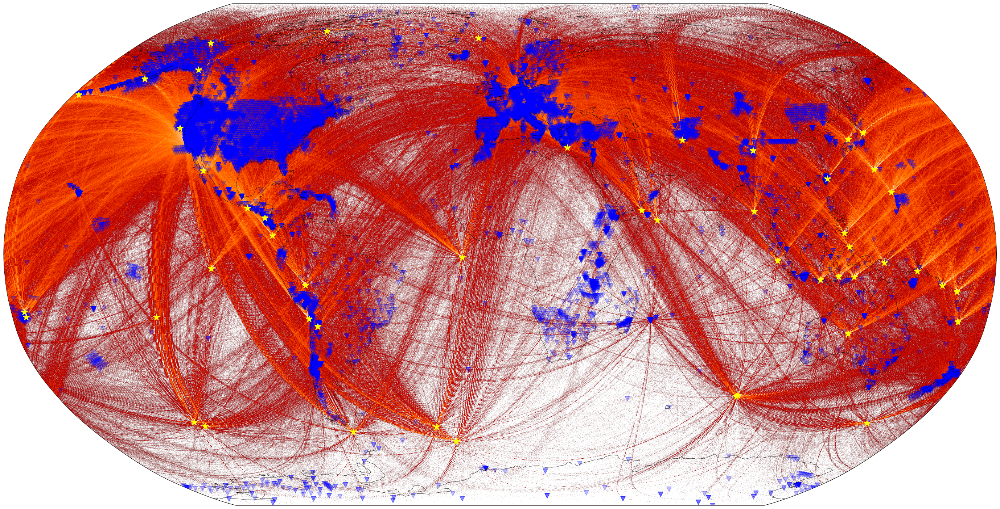

In [33]:
# Global Figure
fig = plt.figure(figsize=(36,18))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson(central_longitude=0))
ax.add_feature(cp.feature.COASTLINE, lw=0.5, zorder = 13)
ax.scatter(training_src[:,1], training_src[:,0], 180, c = 'yellow', marker = '*', transform=ccrs.PlateCarree(), zorder = 14)
ax.scatter(recs[:,1], recs[:,0], 90, c = 'b', marker = 'v', alpha = 0.25,transform=ccrs.PlateCarree(), zorder = 12)
ax = plot_raydensity(ax, station_events, projection = ccrs.Robinson(central_longitude=0))
plt.savefig(savepath,  bbox_inches='tight', dpi = dpi)
plt.show()

In [ ]:
os.listdir("INVERSIONSON_EU_20s_SM/LASIF_EU_20s/DATA/EARTHQUAKES/")